In [1]:
# Packages importieren
import pandas as pd
import numpy as np
from pandas.plotting import scatter_matrix
import seaborn as sn


In [2]:
# Daten laden
data = pd.read_excel('diabetes.xlsx', engine='openpyxl', sheet_name='data', skiprows=2)

'''
n_pregnant:         Anzahl durchgangene Schwangerschaften
gtt:                Resultat des Glukose-Toleranz-Tests (GTT): Plasma-Glukose-Konzentration 2 Stunden nach Verabreichung einer Zuckerlösung (mmol/L)
blood_pressure:     Diastolischer Blutdruck (mm Hg)
triceps_skin_fold_thickness:Dicke einer Triceps-Hautfalte, die zur Bestimmung des Körperfettanteils eingesetzt wird (mm)
insulin:        	Insulin-Konzentration 2 Stunden nach Verabreichung einer Zuckerlösung (μU/ml)
bmi:            	Body-Mass-Index: Gewicht in kg / (Grösse in m)^2
dpf:            	diabetes pedigree function – Grösse zum Diabetesrisiko aus Diabetes-Fallgeschichte der Vorfahren
age:            	Alter in Jahren
class:          	Zugewiesene Klasse (0 kein Diabetes, 1 Diabetes)
'''

In [3]:
data.head(5)

,n_pregnant,gtt,blood_pressure,triceps_skin_fold_thickness,insulin,bmi,dpf,age,class
0,1,85,66,29,0,26.6,0.351,31,0
1,8,183,64,0,0,23.3,0.672,32,1
2,1,89,66,23,94,28.1,0.167,21,0
3,0,137,40,35,168,43.1,2.288,33,1
4,5,116,74,0,0,25.6,0.201,30,0


In [4]:
# Distribution der DAten anschauen
data.describe()

,n_pregnant,gtt,blood_pressure,triceps_skin_fold_thickness,insulin,bmi,dpf,age,class
count,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000
mean,3.842243,120.859192,69.101695,20.517601,79.903520,31.990482,0.471674,33.219035,0.348110
std,3.370877,31.978468,19.368155,15.954059,115.283105,7.889091,0.331497,11.752296,0.476682
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243500,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,32.000000,32.000000,0.371000,29.000000,0.000000
75%,6.000000,140.000000,80.000000,32.000000,127.500000,36.600000,0.625000,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


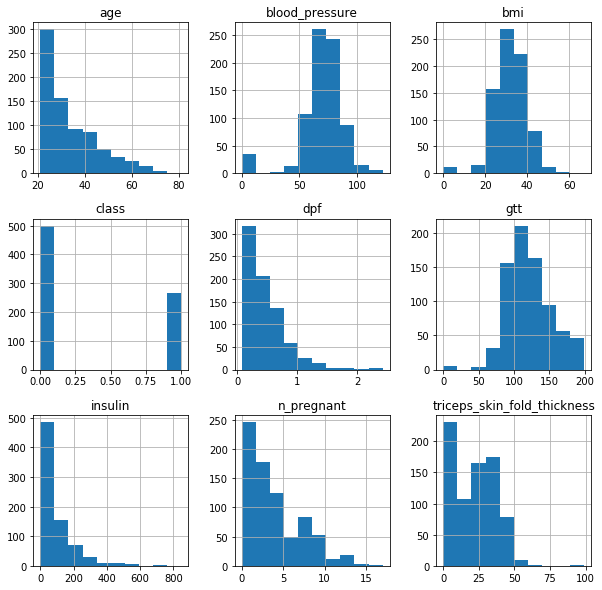

In [5]:
data.hist(figsize=(10,10))

# blood pressure, bmi, gtt haben Werte die 0 sind
zerocols = ['blood_pressure','bmi','gtt']

In [6]:
# Bereinigung der 0 Werte
for col in zerocols:
    data[col] = data[col].replace(0,np.nan)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc4c01e79d0>,
      dtype=object)

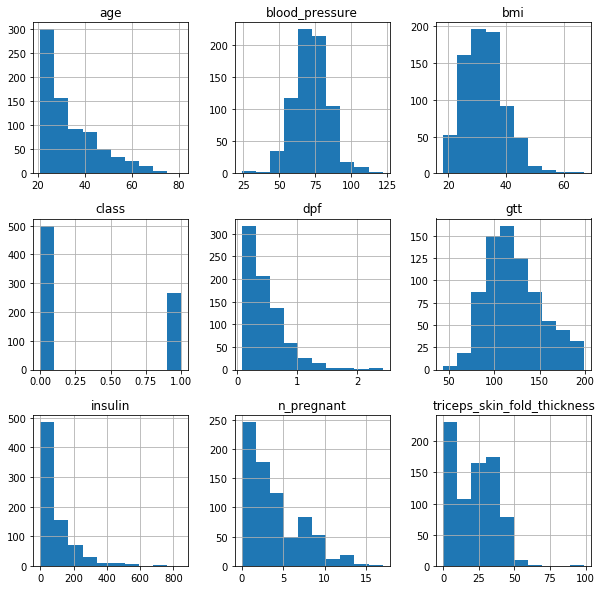

In [7]:
data.hist(figsize=(10,10))

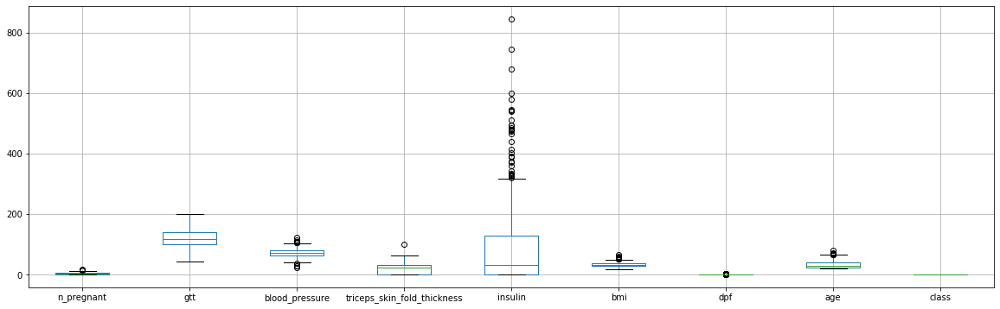

In [73]:
data.boxplot(figsize=(20,6))

class
0    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
1    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
dtype: object

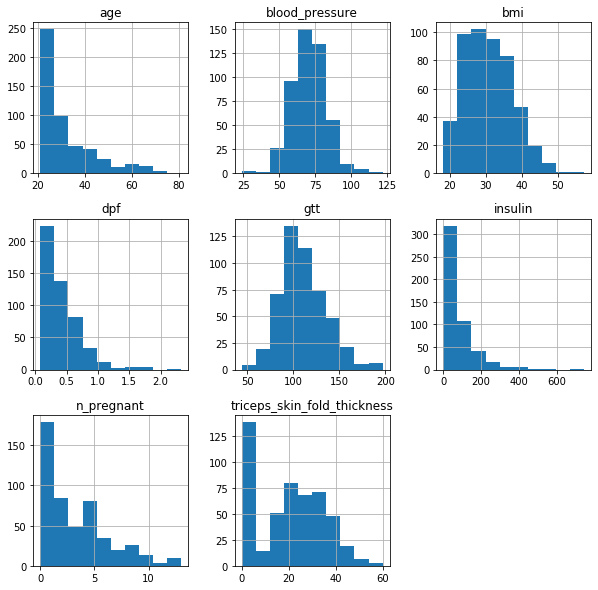

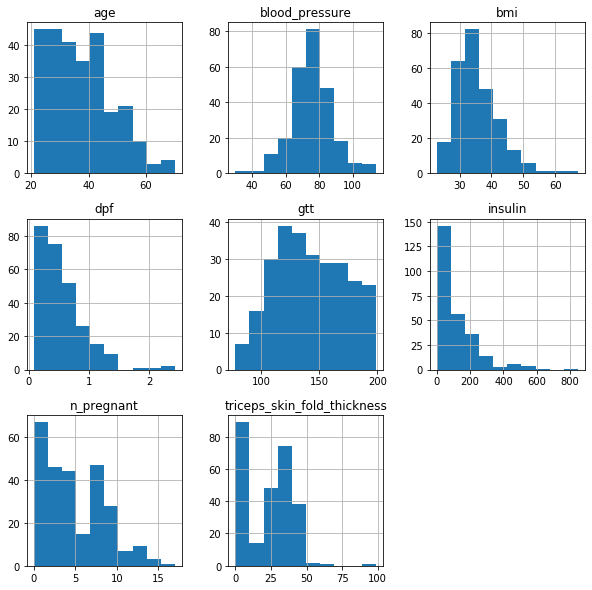

In [8]:
# Verteilung der DAaten nach Class
data.groupby('class').hist(figsize=(10,10))

# Die meisten Werte sind in beiden Klassen etwas gleichmässig verteilt, mit Ausnahme von Age und gtt

class
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: gtt, dtype: object

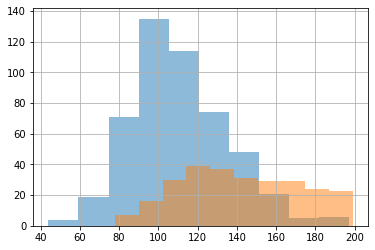

In [9]:
# gtt beider Klassen in einem Histogram
data.groupby('class').gtt.hist(alpha=0.5)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb85fccdfa0>,
      dtype=object)

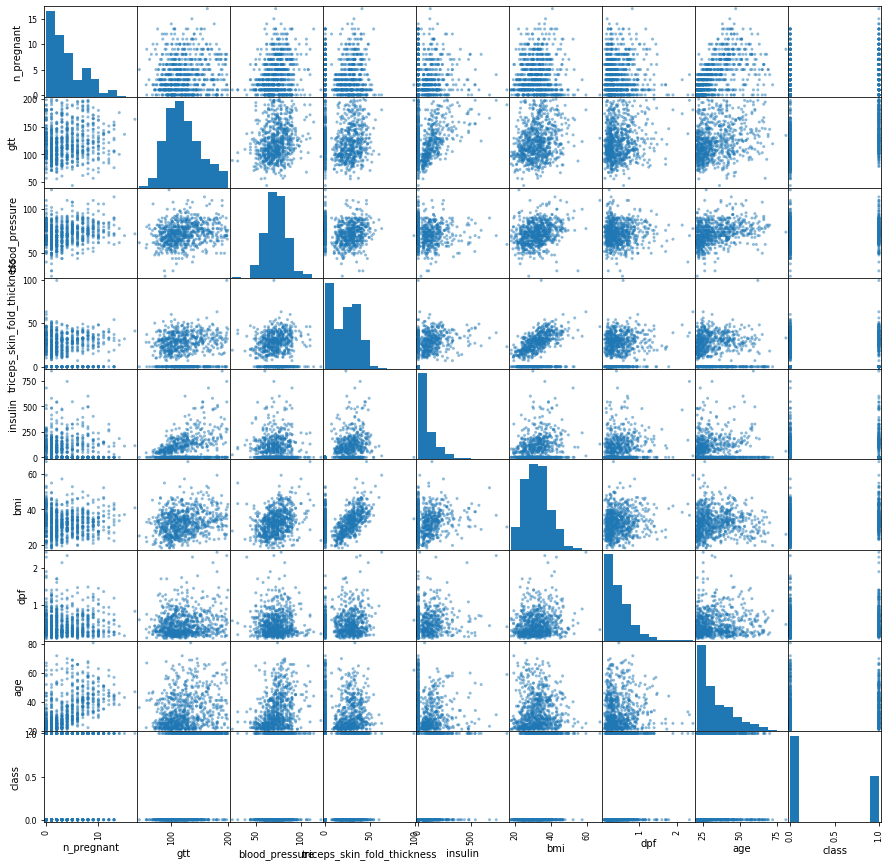

In [78]:

scatter_matrix(data,figsize=(15,15))

In [79]:
# Korrelationsmatrix
data.corr()



,n_pregnant,gtt,blood_pressure,triceps_skin_fold_thickness,insulin,bmi,dpf,age,class
n_pregnant,1.000000,0.127510,0.214267,-0.082495,-0.072999,0.021585,-0.033927,0.544018,0.221087
gtt,0.127510,1.000000,0.223345,0.074225,0.332606,0.232700,0.136805,0.266009,0.493950
blood_pressure,0.214267,0.223345,1.000000,0.006399,-0.047424,0.289243,-0.002785,0.330618,0.170874
triceps_skin_fold_thickness,-0.082495,0.074225,0.006399,1.000000,0.437974,0.384601,0.183498,-0.115873,0.073265
insulin,-0.072999,0.332606,-0.047424,0.437974,1.000000,0.185573,0.185579,-0.040942,0.131984
bmi,0.021585,0.232700,0.289243,0.384601,0.185573,1.000000,0.155305,0.025564,0.313773
dpf,-0.033927,0.136805,-0.002785,0.183498,0.185579,0.155305,1.000000,0.032738,0.173245
age,0.544018,0.266009,0.330618,-0.115873,-0.040942,0.025564,0.032738,1.000000,0.236417
class,0.221087,0.493950,0.170874,0.073265,0.131984,0.313773,0.173245,0.236417,1.000000


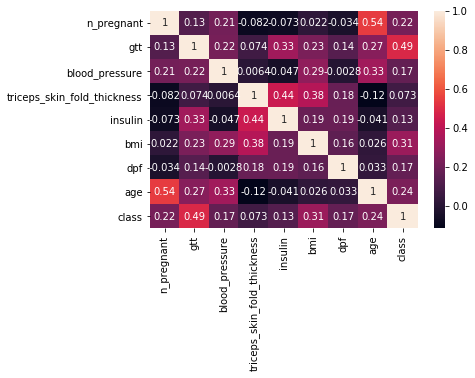

In [82]:
# Korrelationsmatrix visualisiert
sn.heatmap(data.corr(), annot=True)

# höchste Werte werden Erreicht bei:
# * age - n_pregnant 
# * insulin - ricepts_skin_fold_thickness
# * bmi - tricepts_skin_fold_thickness

In [121]:
# NaN zählen
for col in zerocols:
    num_nan = data[col].isna().sum()
    p_nan = round(100 / data[col].count() * num_nan,2)
    print('Number of NaN in column {0}: {1} or {2}%'.format(col,num_nan,p_nan))


Number of NaN in column blood_pressure: 35 or 4.78%
Number of NaN in column bmi: 11 or 1.46%
Number of NaN in column gtt: 5 or 0.66%


In [125]:
# Zeilen zählen in welchen NaNs vorkommen
data.isna().any(axis=1).sum()

44

In [136]:
# Ersetzen der NaN Werte
# Bei allen fehlenden Werten ist der Mean und Median fast identisch. Da der Median jeweils einem tatsächlich vorkommenden Wert entspricht (also keine Nachkommastellen) wird überall der Median verwendet

for col in zerocols:
    data[col].fillna(data[col].median(), inplace=True)


In [137]:
data.isna().sum()

n_pregnant                     0
gtt                            0
blood_pressure                 0
triceps_skin_fold_thickness    0
insulin                        0
bmi                            0
dpf                            0
age                            0
class                          0
dtype: int64

## Data Analysis


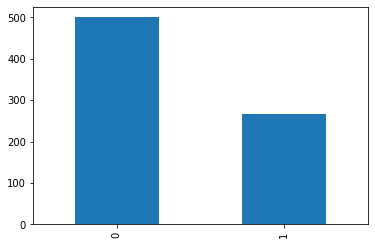

In [14]:
# Wiviele Personen haben Diabetes und wieviele nicht
data['class'].value_counts().plot.bar()

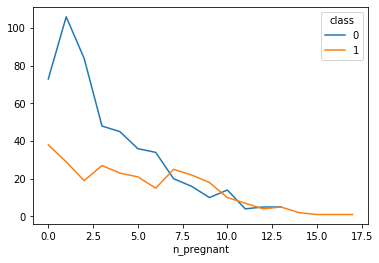

In [58]:
# Anzahl an Personen mit und ohne Diabetes pro Anzahl Schwangerschaft
data.groupby('n_pregnant')['class'].value_counts().unstack().plot()


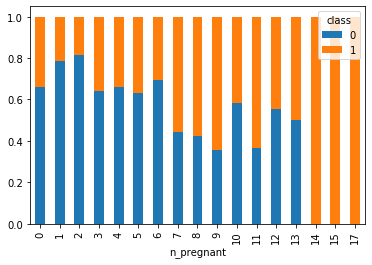

In [60]:
# Relative Anzahl an Diabetes pro Anzahl Schwangerschaft
data.groupby(['n_pregnant'])['class'].value_counts(normalize=True).unstack().plot.bar(stacked=True)

class
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: dpf, dtype: object

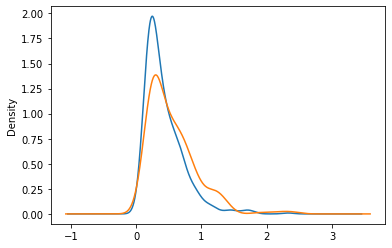

In [82]:
# Diabetes Pedigree Function (dpf)
data.groupby('class').dpf.plot.density()

In [67]:
# Altergruppen hinzufügen
data['age_group'] = pd.cut(x=data['age'], bins=[20,30,40,50,60,70])

In [89]:
# Anzahl Personen pro Altergruppe
data.groupby('age_group').size()

age_group
(20, 30]    417
(30, 40]    157
(40, 50]    112
(50, 60]     54
(60, 70]     25
dtype: int64

In [74]:
# Verhältnis pro Altergruppe
data.groupby('age_group')['class'].value_counts(normalize=True)

age_group  class
(20, 30]   0        0.784173
           1        0.215827
(30, 40]   0        0.515924
           1        0.484076
(40, 50]   1        0.562500
           0        0.437500
(50, 60]   1        0.574074
           0        0.425926
(60, 70]   0        0.720000
           1        0.280000
Name: class, dtype: float64

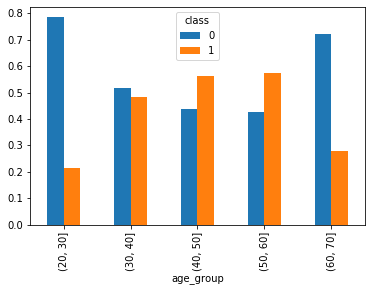

In [91]:
data.groupby('age_group')['class'].value_counts(normalize=True).unstack().plot.bar()

In [78]:
# BMI Kategorie hinzufügen
data['bmi_class'] = pd.cut(x=data['bmi'], bins=[0,18.5,25,30,100], labels=['underweight','normal','overweight','obese'])